In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer

C:\Users\ASUS\AppData\Roaming\Python\Python310\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
df=pd.read_json(r"C:\Users\ASUS\Downloads\news.json")

In [3]:
df

,content,target,target_names
0,From: lerxst@wam.umd.edu (where's my thing)\nS...,7,rec.autos
1,From: guykuo@carson.u.washington.edu (Guy Kuo)...,4,comp.sys.mac.hardware
2,From: twillis@ec.ecn.purdue.edu (Thomas E Will...,4,comp.sys.mac.hardware
3,From: jgreen@amber (Joe Green)\nSubject: Re: W...,1,comp.graphics
4,From: jcm@head-cfa.harvard.edu (Jonathan McDow...,14,sci.space
...,...,...,...
11309,From: jim.zisfein@factory.com (Jim Zisfein) \n...,13,sci.med
11310,From: ebodin@pearl.tufts.edu\nSubject: Screen ...,4,comp.sys.mac.hardware
11311,From: westes@netcom.com (Will Estes)\nSubject:...,3,comp.sys.ibm.pc.hardware
11312,From: steve@hcrlgw (Steven Collins)\nSubject: ...,1,comp.graphics


In [4]:
data=df['content'].values.tolist()

In [5]:
data

["From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: guykuo@carson.u.washington.edu (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 

Preprocessing

In [6]:
import re

In [7]:
pattern=re.compile('\S*@\S*\s?')

In [8]:
data=[re.sub(pattern,'',sentence) for sentence in data]

In [9]:
data

["From: (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 11\nNNTP-Posting-Host: carson.u.washington.edu\n\n

In [10]:
pattern2=re.compile(r'\n')

In [11]:
data=[re.sub(pattern,' ',sentence) for sentence in data]

In [12]:
data

["From: (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n",
 "From: (Guy Kuo)\nSubject: SI Clock Poll - Final Call\nSummary: Final call for SI clock reports\nKeywords: SI,acceleration,clock,upgrade\nArticle-I.D.: shelley.1qvfo9INNc3s\nOrganization: University of Washington\nLines: 11\nNNTP-Posting-Host: carson.u.washington.edu\n\n

In [13]:
data=[re.sub(r'\s+',' ',sent) for sent in data]

In [14]:
data

["From: (where's my thing) Subject: WHAT car is this!? Nntp-Posting-Host: rac3.wam.umd.edu Organization: University of Maryland, College Park Lines: 15 I was wondering if anyone out there could enlighten me on this car I saw the other day. It was a 2-door sports car, looked to be from the late 60s/ early 70s. It was called a Bricklin. The doors were really small. In addition, the front bumper was separate from the rest of the body. This is all I know. If anyone can tellme a model name, engine specs, years of production, where this car is made, history, or whatever info you have on this funky looking car, please e-mail. Thanks, - IL ---- brought to you by your neighborhood Lerxst ---- ",
 "From: (Guy Kuo) Subject: SI Clock Poll - Final Call Summary: Final call for SI clock reports Keywords: SI,acceleration,clock,upgrade Article-I.D.: shelley.1qvfo9INNc3s Organization: University of Washington Lines: 11 NNTP-Posting-Host: carson.u.washington.edu A fair number of brave souls who upgraded 

In [15]:
data=pd.Series(data)

In [16]:
data

0        From: (where's my thing) Subject: WHAT car is ...
1        From: (Guy Kuo) Subject: SI Clock Poll - Final...
2        From: (Thomas E Willis) Subject: PB questions....
3        From: (Joe Green) Subject: Re: Weitek P9000 ? ...
4        From: (Jonathan McDowell) Subject: Re: Shuttle...
                               ...                        
11309    From: (Jim Zisfein) Subject: Re: Migraines and...
11310    From: Subject: Screen Death: Mac Plus/512 Line...
11311    From: (Will Estes) Subject: Mounting CPU Coole...
11312    From: (Steven Collins) Subject: Re: Sphere fro...
11313    From: (Kevin J. Gunning) Subject: stolen CBR90...
Length: 11314, dtype: object

In [17]:
data[0]

"From: (where's my thing) Subject: WHAT car is this!? Nntp-Posting-Host: rac3.wam.umd.edu Organization: University of Maryland, College Park Lines: 15 I was wondering if anyone out there could enlighten me on this car I saw the other day. It was a 2-door sports car, looked to be from the late 60s/ early 70s. It was called a Bricklin. The doors were really small. In addition, the front bumper was separate from the rest of the body. This is all I know. If anyone can tellme a model name, engine specs, years of production, where this car is made, history, or whatever info you have on this funky looking car, please e-mail. Thanks, - IL ---- brought to you by your neighborhood Lerxst ---- "

In [18]:
data=data.apply(lambda x: re.sub(r'[^a-zA-z\s]+',' ',x).lower())

In [19]:
data

0        from   where s my thing  subject  what car is ...
1        from   guy kuo  subject  si clock poll   final...
2        from   thomas e willis  subject  pb questions ...
3        from   joe green  subject  re  weitek p    org...
4        from   jonathan mcdowell  subject  re  shuttle...
                               ...                        
11309    from   jim zisfein  subject  re  migraines and...
11310    from  subject  screen death  mac plus  lines  ...
11311    from   will estes  subject  mounting cpu coole...
11312    from   steven collins  subject  re  sphere fro...
11313    from   kevin j  gunning  subject  stolen cbr r...
Length: 11314, dtype: object

In [20]:
s=stopwords.words('english')

In [21]:
s.extend(['from','subject','re','edu','use'])

In [22]:
 data_final=data.apply(lambda x: ' '.join([word for word in word_tokenize(x) if word not in s and len(word)>2]))

In [23]:
data_final

0        thing car nntp posting host rac wam umd organi...
1        guy kuo clock poll final call summary final ca...
2        thomas willis questions organization purdue un...
3        joe green weitek organization harris computer ...
4        jonathan mcdowell shuttle launch question orga...
                               ...                        
11309    jim zisfein migraines scans distribution world...
11310    screen death mac plus lines organization tufts...
11311    estes mounting cpu cooler vertical case organi...
11312    steven collins sphere points organization cent...
11313    kevin gunning stolen cbr organization californ...
Length: 11314, dtype: object

Exploratory Data Analysis

In [24]:
word_list=[]
for sent in data_final:
    word_list.extend(word_tokenize(sent))

In [25]:
len(word_list)

1657829

In [26]:
freq_dist=nltk.FreqDist(word_list)

In [27]:
freq_dist.most_common(20)

[('lines', 11837),
 ('organization', 11233),
 ('one', 9007),
 ('would', 8905),
 ('writes', 7844),
 ('article', 7435),
 ('people', 5975),
 ('like', 5853),
 ('university', 5584),
 ('posting', 5507),
 ('know', 5128),
 ('host', 4984),
 ('get', 4952),
 ('nntp', 4809),
 ('think', 4537),
 ('also', 4305),
 ('max', 4304),
 ('time', 4093),
 ('new', 3967),
 ('good', 3758)]

In [31]:
common=freq_dist.most_common(20)

In [33]:
common=pd.DataFrame(common,columns=['word','count'])

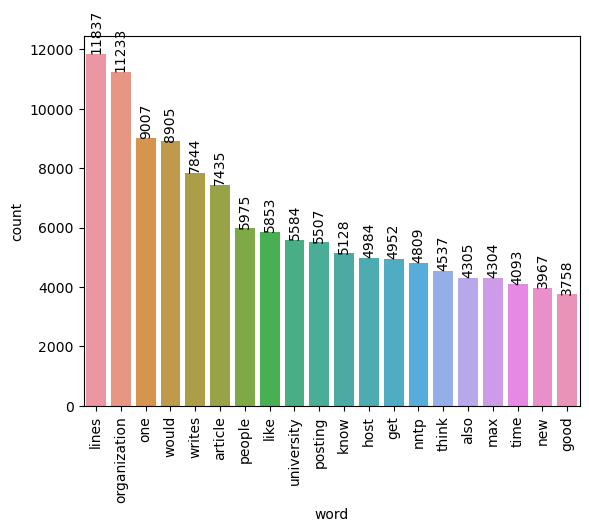

In [36]:
ax=sns.barplot(x='word',y='count',data=common)
plt.xticks(rotation=90)
for bars in ax.containers:
    ax.bar_label(bars,rotation=90)
plt.show()

In [37]:
from wordcloud import WordCloud
wc=WordCloud(width=200,height=200,background_color='white')

In [41]:
fig=wc.generate_from_frequencies(freq_dist)

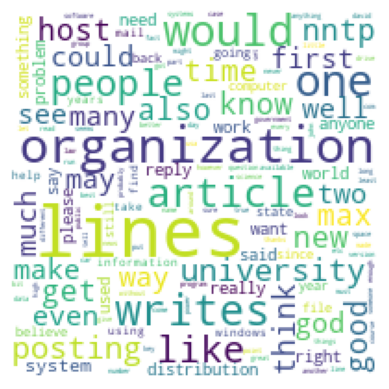

In [42]:
plt.imshow(fig)
plt.axis('off')
plt.show()

In [48]:
import gensim
from gensim.models import Phrases
from gensim.models.phrases import Phraser

In [44]:
data_final

0        thing car nntp posting host rac wam umd organi...
1        guy kuo clock poll final call summary final ca...
2        thomas willis questions organization purdue un...
3        joe green weitek organization harris computer ...
4        jonathan mcdowell shuttle launch question orga...
                               ...                        
11309    jim zisfein migraines scans distribution world...
11310    screen death mac plus lines organization tufts...
11311    estes mounting cpu cooler vertical case organi...
11312    steven collins sphere points organization cent...
11313    kevin gunning stolen cbr organization californ...
Length: 11314, dtype: object

In [46]:
tokens=[x.split() for x in data_final]

In [50]:
bigram=Phrases(tokens,min_count=5,threshold=100)

In [51]:
trigram=Phrases(bigram[tokens], threshold=100)

In [53]:
b_phraser=Phraser(bigram)
t_phraser=Phraser(trigram)

In [54]:
bow=[t_phraser[b_phraser[words]] for words in tokens]

In [55]:
bow

[['thing',
  'car',
  'nntp_posting_host',
  'rac_wam',
  'umd',
  'organization',
  'university',
  'maryland_college_park',
  'lines',
  'wondering',
  'anyone',
  'could',
  'enlighten',
  'car',
  'saw',
  'day',
  'door',
  'sports_car',
  'looked',
  'late',
  'early',
  'called',
  'bricklin',
  'doors',
  'really',
  'small',
  'addition',
  'front_bumper',
  'separate',
  'rest',
  'body',
  'know',
  'anyone',
  'tellme',
  'model',
  'name',
  'engine',
  'specs',
  'years',
  'production',
  'car',
  'made',
  'history',
  'whatever',
  'info',
  'funky',
  'looking',
  'car',
  'please',
  'mail',
  'thanks',
  'brought',
  'neighborhood',
  'lerxst'],
 ['guy_kuo',
  'clock',
  'poll',
  'final',
  'call',
  'summary',
  'final',
  'call',
  'clock',
  'reports',
  'keywords',
  'acceleration',
  'clock',
  'upgrade',
  'article_shelley',
  'qvfo',
  'innc',
  'organization',
  'university',
  'washington',
  'lines_nntp_posting',
  'host',
  'carson_washington',
  'fair',

Lemmatization and POS tagging

In [68]:
from nltk.tag import pos_tag
from nltk.corpus import wordnet

In [61]:
def get_tag(x):
    if x.startswith('J'):
        return wordnet.ADJ
    elif x.startswith('V'):
        return wordnet.VERB
    elif x.startswith('N'):
        return wordnet.NOUN
    elif x.startswith('R'):
        return wordnet.ADV
    else:
        return None

In [75]:
def lem(tok):
    pos_tokens=pos_tag(tokens)
    lem=WordNetLemmatizer()
    lem_tokens=[lem.lemmatize(token,get_tag(pos)) if get_tag(pos) else token for token, pos in pos_tokens]
    return lem_tokens

In [71]:
from gensim import corpora

In [76]:
bag_of_words=[]

In [77]:
for tokens in bow:
    bag_of_words.append(lem(tokens))

In [78]:
bag_of_words[0]

['thing',
 'car',
 'nntp_posting_host',
 'rac_wam',
 'umd',
 'organization',
 'university',
 'maryland_college_park',
 'line',
 'wonder',
 'anyone',
 'could',
 'enlighten',
 'car',
 'saw',
 'day',
 'door',
 'sports_car',
 'look',
 'late',
 'early',
 'call',
 'bricklin',
 'door',
 'really',
 'small',
 'addition',
 'front_bumper',
 'separate',
 'rest',
 'body',
 'know',
 'anyone',
 'tellme',
 'model',
 'name',
 'engine',
 'spec',
 'year',
 'production',
 'car',
 'make',
 'history',
 'whatever',
 'info',
 'funky',
 'look',
 'car',
 'please',
 'mail',
 'thanks',
 'bring',
 'neighborhood',
 'lerxst']

In [79]:
d=corpora.Dictionary(bag_of_words)

In [81]:
print(d)

Dictionary<81184 unique tokens: ['addition', 'anyone', 'body', 'bricklin', 'bring']...>


In [82]:
corpus_matrix=[d.doc2bow(x) for x in bag_of_words]

In [83]:
corpus_matrix

[[(0, 1),
  (1, 2),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 4),
  (7, 1),
  (8, 1),
  (9, 2),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 2),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1)],
 [(5, 2),
  (8, 2),
  (29, 1),
  (30, 2),
  (41, 1),
  (44, 1),
  (48, 1),
  (49, 1),
  (50, 2),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 5),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 2),
  (65, 1),
  (66, 2),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 2),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 3),
  (85, 1),

In [85]:
import gensim
model=gensim.models.ldamodel.LdaModel

In [87]:
lda_model=model(corpus=corpus_matrix,id2word=d,num_topics=20,random_state=10,update_every=1,chunksize=100,passes=5,per_word_topics=True,alpha='auto')

In [88]:
lda_model.print_topics()

[(0,
  '0.062*"patient" + 0.039*"canada" + 0.032*"disease" + 0.029*"air" + 0.024*"united_states" + 0.023*"weight" + 0.021*"processor" + 0.021*"treatment" + 0.019*"medical" + 0.019*"vote"'),
 (1,
  '0.108*"drive" + 0.053*"mac" + 0.042*"cpu" + 0.036*"memory" + 0.026*"slow" + 0.026*"chip" + 0.026*"card" + 0.023*"scsi" + 0.023*"speed" + 0.022*"apple"'),
 (2,
  '0.029*"popular" + 0.028*"park" + 0.027*"oil" + 0.027*"engine" + 0.024*"craig" + 0.018*"honor" + 0.017*"reply_message_apr" + 0.014*"buffer" + 0.008*"yankee" + 0.008*"stadium"'),
 (3,
  '0.093*"game" + 0.092*"team" + 0.065*"win" + 0.059*"play" + 0.028*"fan" + 0.025*"year" + 0.023*"score" + 0.020*"goal" + 0.018*"run" + 0.016*"van"'),
 (4,
  '0.083*"car" + 0.064*"gun" + 0.029*"wire" + 0.023*"safety" + 0.021*"weapon" + 0.021*"police" + 0.019*"internal" + 0.018*"secure" + 0.017*"crime" + 0.016*"firearm"'),
 (5,
  '0.122*"file" + 0.061*"image" + 0.052*"entry" + 0.038*"display" + 0.028*"format" + 0.024*"function" + 0.022*"section" + 0.018*"

In [89]:
!pip install pyLDAvis -q

ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\ASUS\\anaconda3\\Lib\\site-packages\\numpy\\~libs\\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll'
Consider using the `--user` option or check the permissions.



In [90]:
import pyLDAvis
import pyLDAvis.gensim

In [92]:
pyLDAvis.enable_notebook()
vis=pyLDAvis.gensim.prepare(lda_model, corpus=corpus_matrix,dictionary=d)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19     0.405523  0.032282       1        1  34.185530
6      0.342426 -0.248799       2        1  20.164362
10     0.355294  0.044157       3        1  16.943072
7      0.361317  0.134258       4        1  13.363321
16     0.067366  0.228621       5        1   2.899265
3     -0.014603  0.011518       6        1   1.647817
4     -0.034215 -0.025217       7        1   1.580875
5     -0.064299 -0.033268       8        1   1.479595
1     -0.022558 -0.216181       9        1   1.478658
17    -0.059343 -0.074825      10        1   1.098584
0     -0.102994  0.015010      11        1   0.994874
13    -0.116202  0.014416      12        1   0.905753
12    -0.113460  0.014141      13        1   0.654650
9     -0.129173  0.019481      14        1   0.593201
11    -0.129666  0.014247      15        1   0.433943
18    -0.139719  0.015377      16        1   0.404160
14    -0.142055  0.015802      17        1   0.400369
8     -0.145957  0.009922      18        1   0.367065
2     -0.160239  0.014680      19        1   0.208890
15    -0.157442  0.014376      20        1   0.196016, topic_info=               Term          Freq         Total Category  logprob  loglift
47             year   4769.000000   4769.000000  Default  30.0000  30.0000
662             god   5857.000000   5857.000000  Default  29.0000  29.0000
400            file   2731.000000   2731.000000  Default  28.0000  28.0000
20             line  16711.000000  16711.000000  Default  27.0000  27.0000
29     organization  17082.000000  17082.000000  Default  26.0000  26.0000
...             ...           ...           ...      ...      ...      ...
5445     best_offer      0.025616      1.154574  Topic20 -11.6592   2.4265
10574           eng      0.025616      1.154572  Topic20 -11.6592   2.4265
8333         repair      0.025616      1.154573  Topic20 -11.6592   2.4265
8807     video_card      0.025616      1.154575  Topic20 -11.6592   2.4265
8513         jumper      0.025616      1.154724  Topic20 -11.6592   2.4263

[859 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
752       9  0.986441        \__
3464     20  0.987739       ____
3465     20  0.993615      _____
3466     20  0.937542   ________
3467     20  0.573834  _________
...     ...       ...        ...
2483     19  0.943180     yankee
47        1  0.040671       year
47        3  0.828514       year
47        5  0.000419       year
47        6  0.130189       year

[1113 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 7, 11, 8, 17, 4, 5, 6, 2, 18, 1, 14, 13, 10, 12, 19, 15, 9, 3, 16])

In [94]:
lda_model.log_perplexity(corpus_matrix)

-15.41563017395018

In [95]:
from gensim.models import CoherenceModel

In [97]:
coherence_model=CoherenceModel(model=lda_model,texts=bag_of_words,dictionary=d,coherence='c_v')

In [98]:
coherence_model.get_coherence()

0.4991617390185527

Finding Number of Topics

In [108]:
def compute_coherence(dict,corpus,text,limit,start=2,step=3):
    coherence_values=[]
    model_list=[]
    for num_topics in range(start,limit,step):
        model=gensim.models.ldamodel.LdaModel
        lda_model=model(corpus=corpus,num_topics=num_topics,id2word=dict)
        model_list.append(lda_model)
        coh=CoherenceModel(model=lda_model,texts=text,dictionary=dict,coherence='c_v')
        coherence_values.append(coh.get_coherence())
    return model_list,coherence_values

In [109]:
model_list, coherence_values=compute_coherence(dict=d,corpus=corpus_matrix,text=bag_of_words,start=2,limit=40,step=5)

In [110]:
models=pd.DataFrame({'Model':model_list,'Coherence':coherence_values})
models

,Model,Coherence
0,"LdaModel<num_terms=81184, num_topics=2, decay=...",0.447671
1,"LdaModel<num_terms=81184, num_topics=7, decay=...",0.453569
2,"LdaModel<num_terms=81184, num_topics=12, decay...",0.403473
3,"LdaModel<num_terms=81184, num_topics=17, decay...",0.498373
4,"LdaModel<num_terms=81184, num_topics=22, decay...",0.462593
5,"LdaModel<num_terms=81184, num_topics=27, decay...",0.446866
6,"LdaModel<num_terms=81184, num_topics=32, decay...",0.451198
7,"LdaModel<num_terms=81184, num_topics=37, decay...",0.427346
